In [1]:
import scipy.io
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os

In [2]:
# f = "/mnt/c/Users/tomasz/OneDrive - University of Edinburgh/model_RNAPI_matlab/20230112_termination_simulations/Data20230112/2023_1_12_13_15_58.mat"
# mat = scipy.io.loadmat(f)
# mat['Data'][0][0][10]

# data pre-processing

In [4]:
def parseMatOutput(filePath):
    names = ['sigma','lenValue','outOfBound','rpa12Cleavage','minRange','RNAPbubble','hybridFile','saveHistOnly','nRuns','tMax','dt','structureFile','c','dist','v5end','addProb','vInt','preTermProb','preTermDist','backtrackingVelocity','rnt1Cleavage','structure2consider','structureStrength','hybridStrength','name']

    mat = scipy.io.loadmat(filePath)
    ### order ###
    # mids, rhoFull, dxAvgFull, structureFull, hybridFull, windingFull, backtrackingFull, backtrackingFullRaw, collistionsFull, collisionsFullRaw
    
    #output full
    output_full = pd.DataFrame(index=mat['Data'][0][0][0][0])
    output = pd.DataFrame()
    params = pd.DataFrame(index=names)

    for n,i in enumerate(mat['Data'][0][0][1]): #rhoFull
        output_full['data_'+str(n)] = i
    
    #output
    output['nParticles'] = [i[0] for i in mat['Data'][0][0][10]]
    output['xEnd'] = [i[0] for i in mat['Data'][0][0][11]]
    output['xEndPremature'] = [i[0] for i in mat['Data'][0][0][12]]
    output['tTaken'] = [pd.Series(i).mean() for i in mat['Data'][0][0][13].T]
    
    #parameters  
    param_temp = [i[0] for i in mat['Data'][0][0][14][0][0]]
    
    param_clean = []
    for i in param_temp:
        if type(i) == np.ndarray:           
            param_clean.append(i[0])
        else:
            param_clean.append(i)

    params['run'] = param_clean
   
    return output, params, output_full.mean(1)


#Dell
# path = "/mnt/c/Users/tomasz/OneDrive - University of Edinburgh/model_RNAPI_matlab/20230112_termination_simulations/Data20230113/"

#ThinkPad
path = "/mnt/c/Users/tomasz/OneDrive - INSTYTUT BIOCHEMII I BIOFIZYKI PAN/model_RNAPI_matlab/20230112_termination_simulations/Data_20230201/"

df00_output = pd.DataFrame()
df01_plots = pd.DataFrame()
for f in os.listdir(path):
    if f.endswith(".mat"):
        output, params, output_full = parseMatOutput(path+f)

        params = params.to_dict()['run']
        
        #coefficient to multiply nRuns 
        if params['tMax'] == 6000:
            coef = (150 * 0.5) / params['nRuns']
        else:
            exit("tMax different than 6000")
        
        data = {
            'time'        : params['tMax'],
            'c'           : params['c'],
            'dist'        : params['dist'],
            'v5end'       : params['v5end'],
            'addProb'     : params['addProb'],
            'vInt'        : params['vInt'],
            'preTermProb' : params['preTermProb'],
            'preTermDist' : params['preTermDist'],
            'nParticles'    : output['nParticles'].mean(),
            'xEnd'          : output['xEnd'].sum() * coef,
            'xEndPremature' : output['xEndPremature'].sum() * coef,
            'tTaken'        : output['tTaken'].mean()
        }
               
        df00_output[params['name']] = pd.Series(data)
        df01_plots[params['name']] = output_full
                
df00_output

,discrete_0.1,discrete_0.2,discrete_0.3,discrete_0.4,discrete_0.5,discrete_0.6,discrete_0.7,discrete_0.8,discrete_0.9,discrete_1.0,...,fullnoLTRpreElong_0.8_term_2,fullnoLTRpreElong_0.8_term_0.01,fullnoLTRpreElong_0.8_term_6,fullnoLTRpreElong_0.8_term_7,fullnoLTRpreElong_0.8_term_8,fullnoLTRpreElong_0.8_term_9,fullnoLTRpreElong_0.8_term_10,fullnoLTRpreElong_0.8_term_3,fullnoLTRpreElong_0.8_term_4,fullnoLTRpreElong_0.8_term_5
time,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,...,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000
c,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000
dist,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
v5end,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
addProb,0.100000,0.200000,0.300000,0.400000,0.500000,0.600000,0.700000,0.800000,0.900000,1.000000,...,0.800000,0.800000,0.800000,0.800000,0.800000,0.800000,0.800000,0.800000,0.800000,0.800000
vInt,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,...,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000
preTermProb,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.000000,0.010000,6.000000,7.000000,8.000000,9.000000,10.000000,3.000000,4.000000,5.000000
preTermDist,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
nParticles,13.390750,24.859500,34.819437,43.351312,51.289812,57.821500,64.600625,71.213625,77.282312,81.566938,...,34.194250,51.415062,18.407500,16.345312,14.510125,12.948562,11.532437,28.847812,24.557125,21.082375
xEnd,40673.437500,75304.687500,105323.437500,130875.000000,154696.875000,174056.250000,193204.687500,208654.687500,223073.437500,236517.187500,...,128371.875000,199209.375000,64420.312500,56615.625000,49340.625000,43453.125000,38020.312500,106350.000000,88921.875000,74901.562500


In [5]:
#processivity
df00_output = df00_output.T
df00_output['processivity'] = df00_output['xEnd'] / (df00_output['xEnd'] + df00_output['xEndPremature'])
df00_output = df00_output.T
df00_output

,discrete_0.1,discrete_0.2,discrete_0.3,discrete_0.4,discrete_0.5,discrete_0.6,discrete_0.7,discrete_0.8,discrete_0.9,discrete_1.0,...,fullnoLTRpreElong_0.8_term_2,fullnoLTRpreElong_0.8_term_0.01,fullnoLTRpreElong_0.8_term_6,fullnoLTRpreElong_0.8_term_7,fullnoLTRpreElong_0.8_term_8,fullnoLTRpreElong_0.8_term_9,fullnoLTRpreElong_0.8_term_10,fullnoLTRpreElong_0.8_term_3,fullnoLTRpreElong_0.8_term_4,fullnoLTRpreElong_0.8_term_5
time,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,...,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000
c,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000
dist,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
v5end,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
addProb,0.100000,0.200000,0.300000,0.400000,0.500000,0.600000,0.700000,0.800000,0.900000,1.000000,...,0.800000,0.800000,0.800000,0.800000,0.800000,0.800000,0.800000,0.800000,0.800000,0.800000
vInt,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,...,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000
preTermProb,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.000000,0.010000,6.000000,7.000000,8.000000,9.000000,10.000000,3.000000,4.000000,5.000000
preTermDist,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
nParticles,13.390750,24.859500,34.819437,43.351312,51.289812,57.821500,64.600625,71.213625,77.282312,81.566938,...,34.194250,51.415062,18.407500,16.345312,14.510125,12.948562,11.532437,28.847812,24.557125,21.082375
xEnd,40673.437500,75304.687500,105323.437500,130875.000000,154696.875000,174056.250000,193204.687500,208654.687500,223073.437500,236517.187500,...,128371.875000,199209.375000,64420.312500,56615.625000,49340.625000,43453.125000,38020.312500,106350.000000,88921.875000,74901.562500


# Data exploration

<AxesSubplot:>

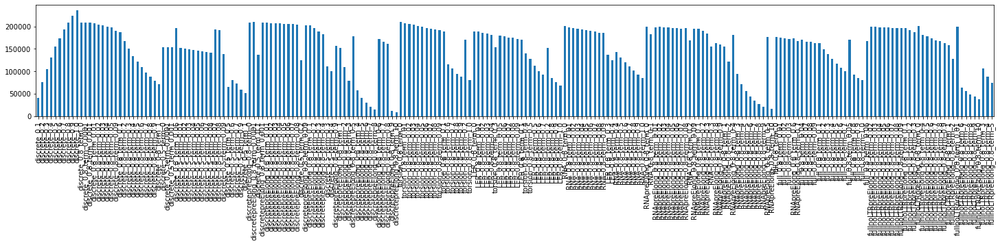

In [6]:
df00_output.T['xEnd'].plot.bar(figsize=(25,3))

In [7]:
modelType = df00_output.columns.to_series().str.split("_",expand=True)[0]
a = df00_output.T
a['modelType'] = modelType
df00_output = a.T
df00_output

,discrete_0.1,discrete_0.2,discrete_0.3,discrete_0.4,discrete_0.5,discrete_0.6,discrete_0.7,discrete_0.8,discrete_0.9,discrete_1.0,...,fullnoLTRpreElong_0.8_term_2,fullnoLTRpreElong_0.8_term_0.01,fullnoLTRpreElong_0.8_term_6,fullnoLTRpreElong_0.8_term_7,fullnoLTRpreElong_0.8_term_8,fullnoLTRpreElong_0.8_term_9,fullnoLTRpreElong_0.8_term_10,fullnoLTRpreElong_0.8_term_3,fullnoLTRpreElong_0.8_term_4,fullnoLTRpreElong_0.8_term_5
time,6000,6000,6000,6000,6000,6000,6000,6000,6000,6000,...,6000,6000,6000,6000,6000,6000,6000,6000,6000,6000
c,0,0,0,0,0,0,0,0,0,0,...,500,500,500,500,500,500,500,500,500,500
dist,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
v5end,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
addProb,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1,...,0.8,0.8,0.8,0.8,0.8,0.8,0.8,0.8,0.8,0.8
vInt,50,50,50,50,50,50,50,50,50,50,...,50,50,50,50,50,50,50,50,50,50
preTermProb,0,0,0,0,0,0,0,0,0,0,...,2,0.01,6,7,8,9,10,3,4,5
preTermDist,0,0,0,0,0,0,0,0,0,0,...,2000,2000,2000,2000,2000,2000,2000,2000,2000,2000
nParticles,13.3907,24.8595,34.8194,43.3513,51.2898,57.8215,64.6006,71.2136,77.2823,81.5669,...,34.1942,51.4151,18.4075,16.3453,14.5101,12.9486,11.5324,28.8478,24.5571,21.0824
xEnd,40673.4,75304.7,105323,130875,154697,174056,193205,208655,223073,236517,...,128372,199209,64420.3,56615.6,49340.6,43453.1,38020.3,106350,88921.9,74901.6


In [8]:
df00_output.T['modelType'].unique()

array(['discrete', 'discretepreElong', 'torsion', 'LER', 'RNA',
       'RNApreElong', 'full', 'fullnoLTRpreElong'], dtype=object)

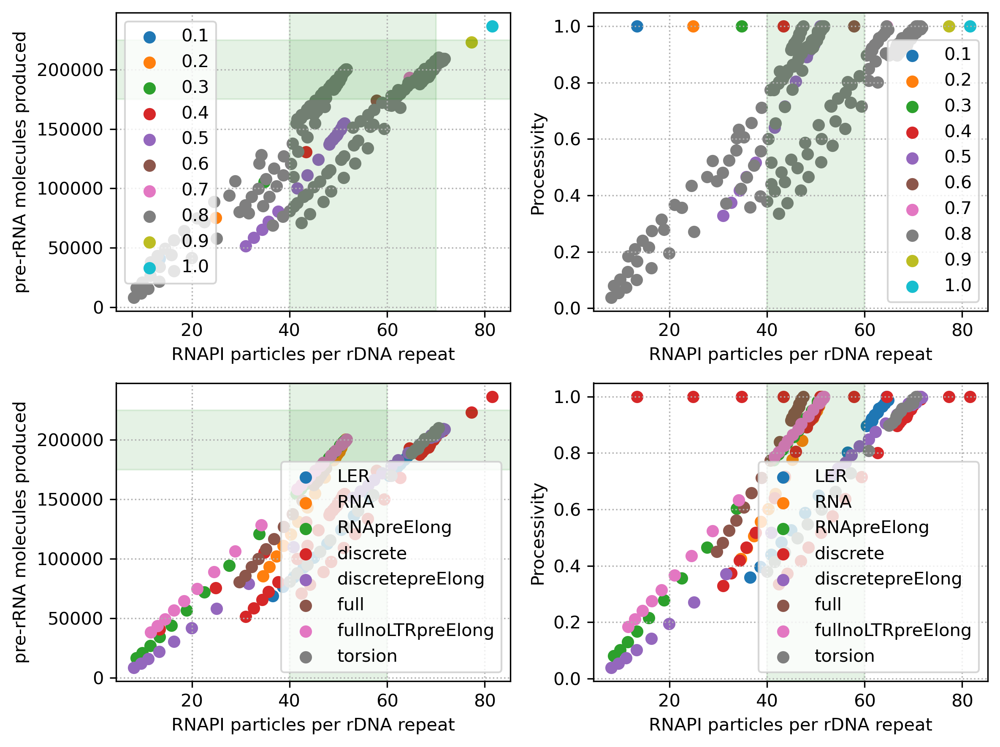

In [9]:
figsize=(8,6)
texts = []
data = df00_output.T
title = ''

fig = plt.figure(figsize=figsize, dpi=300)

#panel 1
ax1 = fig.add_subplot(2,2,1)
ax1.axvspan(40,70,color='green',alpha=0.1)
ax1.axhspan(175000,225000,color='green',alpha=0.1)

for group, df_temp in data.groupby('addProb'):
    a = df_temp['nParticles'].tolist()
    b = df_temp['xEnd'].tolist()
    ax1.scatter(x=a ,y=b ,label=group, cmap="paired")
#     for x, y, s in zip(a, b, df_temp.index.tolist()):
#         texts.append(plt.text(x, y, s))

ax1.legend()
ax1.grid(True,ls="dotted")
ax1.set_xlabel('RNAPI particles per rDNA repeat')
ax1.set_ylabel('pre-rRNA molecules produced')

#panel 2
ax2 = fig.add_subplot(2,2,2)
ax2.axvspan(40,60,color='green',alpha=0.1)
# ax1.axhspan(0,1,color='green',alpha=0.1)

for group, df_temp in data.groupby('addProb'):
    a = df_temp['nParticles'].tolist()
    b = df_temp['processivity'].tolist()
    ax2.scatter(x=a ,y=b ,label=group, cmap="paired")
#     for x, y, s in zip(a, b, df_temp.index.tolist()):
#         texts.append(plt.text(x, y, s))

ax2.legend()
ax2.grid(True,ls="dotted")
ax2.set_xlabel('RNAPI particles per rDNA repeat')
ax2.set_ylabel('Processivity')

#panel 3
ax1 = fig.add_subplot(2,2,3)
ax1.axvspan(40,60,color='green',alpha=0.1)
ax1.axhspan(175000,225000,color='green',alpha=0.1)

for group, df_temp in data.groupby('modelType'):
    a = df_temp['nParticles'].tolist()
    b = df_temp['xEnd'].tolist()
    ax1.scatter(x=a ,y=b ,label=group, cmap="paired")
#     for x, y, s in zip(a, b, df_temp.index.tolist()):
#         texts.append(plt.text(x, y, s))

ax1.legend()
ax1.grid(True,ls="dotted")
ax1.set_xlabel('RNAPI particles per rDNA repeat')
ax1.set_ylabel('pre-rRNA molecules produced')

#panel 4
ax2 = fig.add_subplot(2,2,4)
ax2.axvspan(40,60,color='green',alpha=0.1)
# ax1.axhspan(0,1,color='green',alpha=0.1)

for group, df_temp in data.groupby('modelType'):
    a = df_temp['nParticles'].tolist()
    b = df_temp['processivity'].tolist()
    ax2.scatter(x=a ,y=b ,label=group, cmap="paired")
#     for x, y, s in zip(a, b, df_temp.index.tolist()):
#         texts.append(plt.text(x, y, s))

ax2.legend()
ax2.grid(True,ls="dotted")
ax2.set_xlabel('RNAPI particles per rDNA repeat')
ax2.set_ylabel('Processivity')

plt.title(title)
plt.tight_layout()
# adjust_text(texts, only_move={'points':'y', 'texts':'y'}, arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
plt.show()

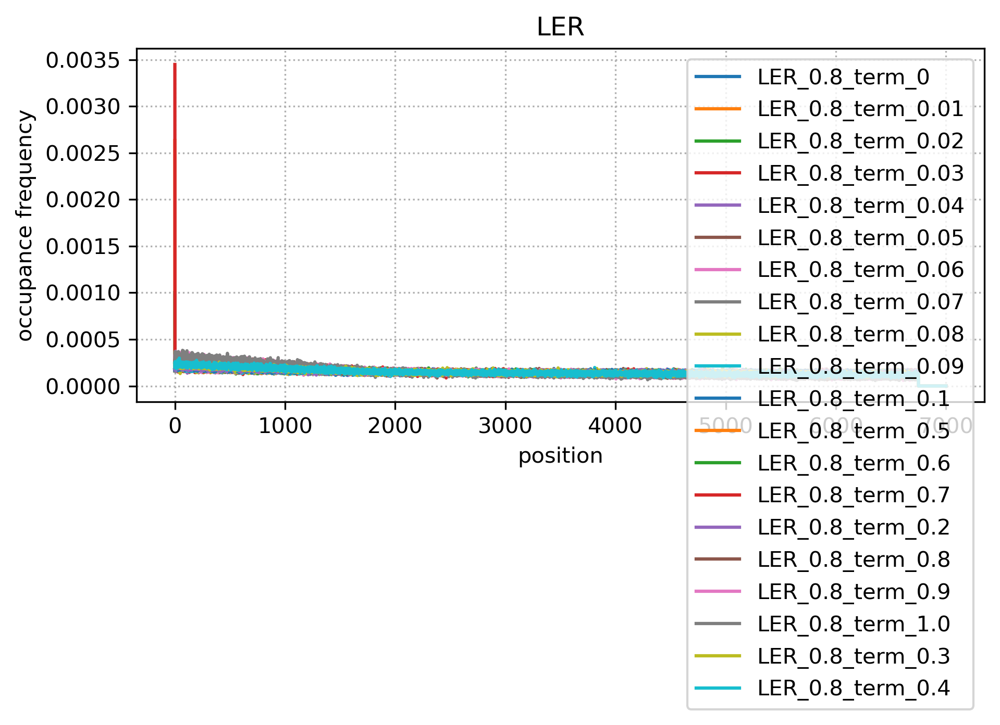

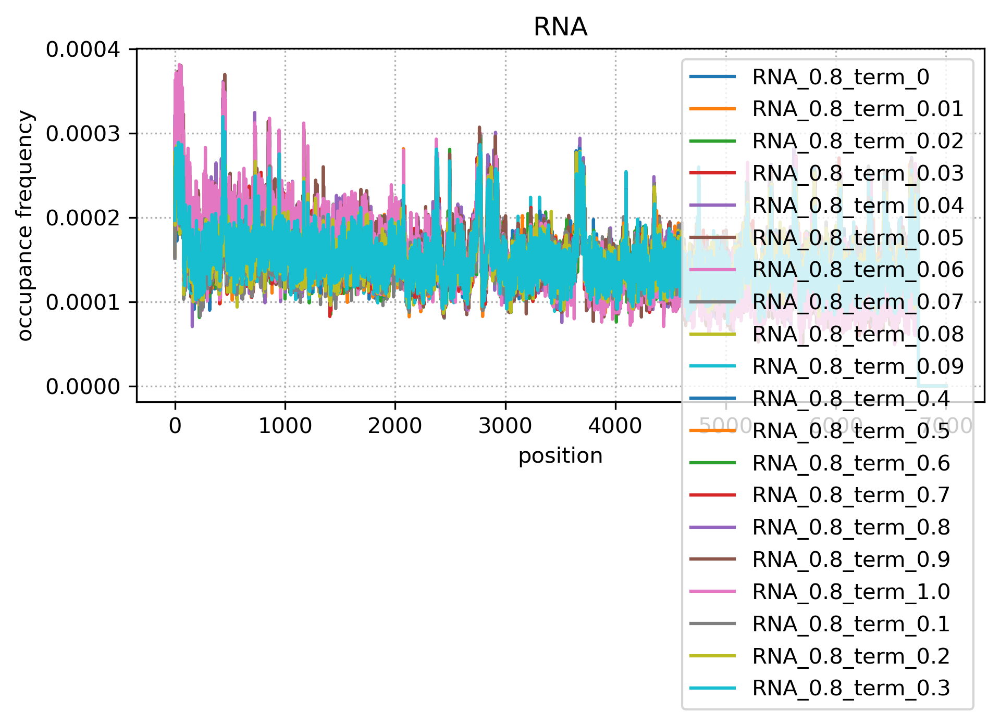

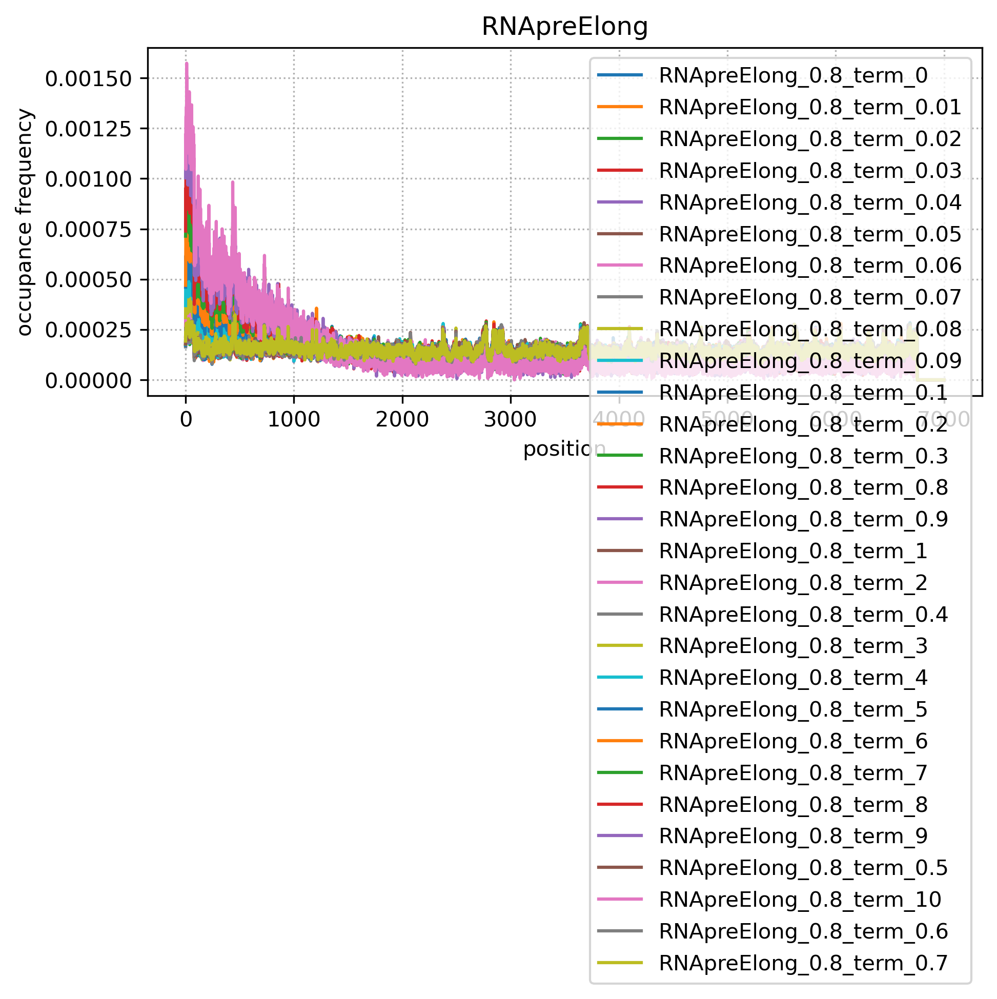

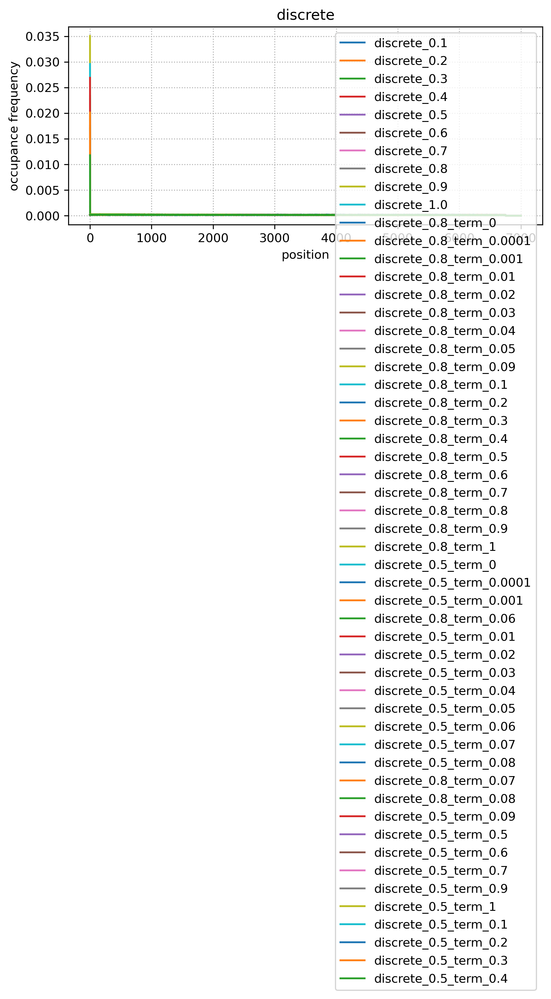

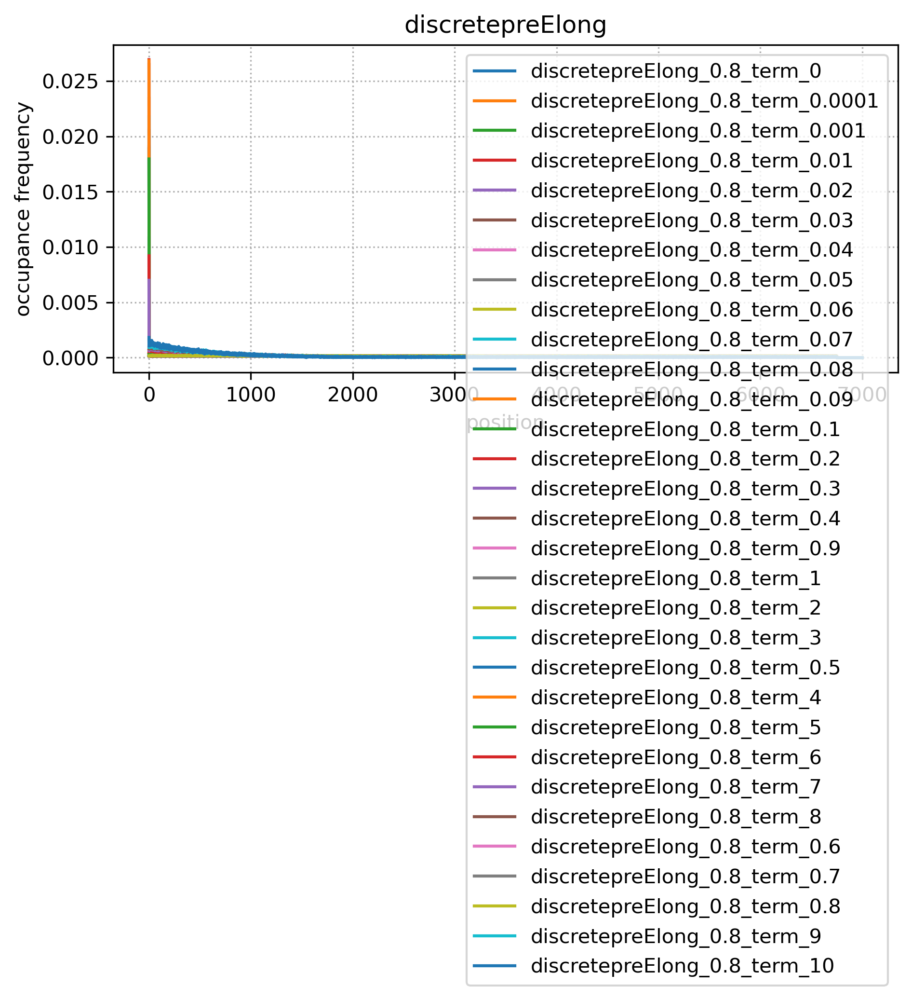

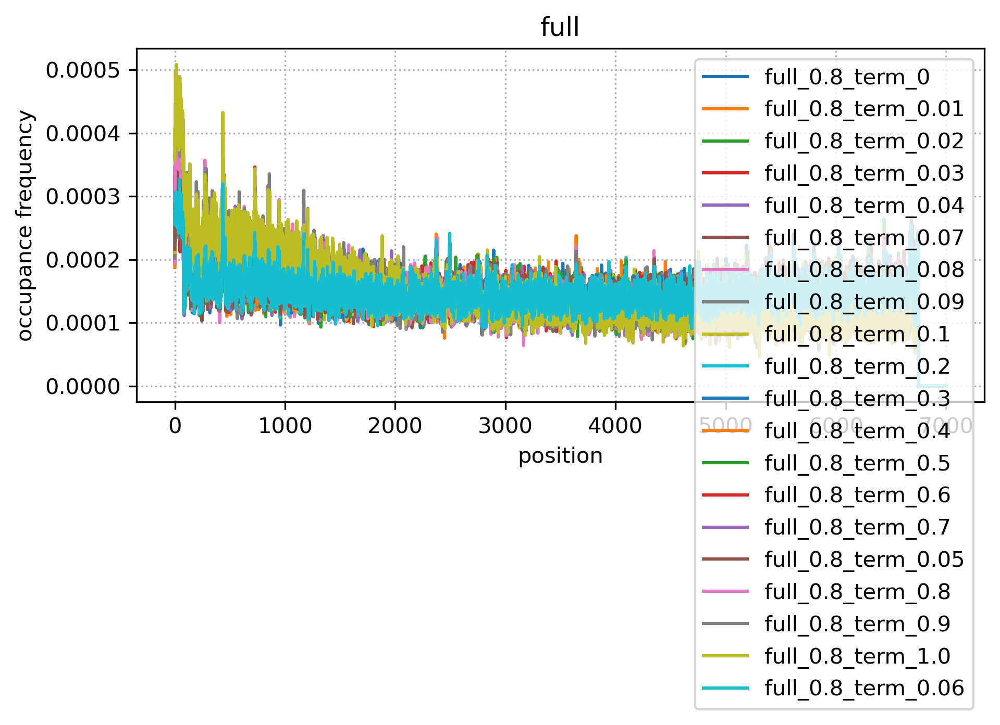

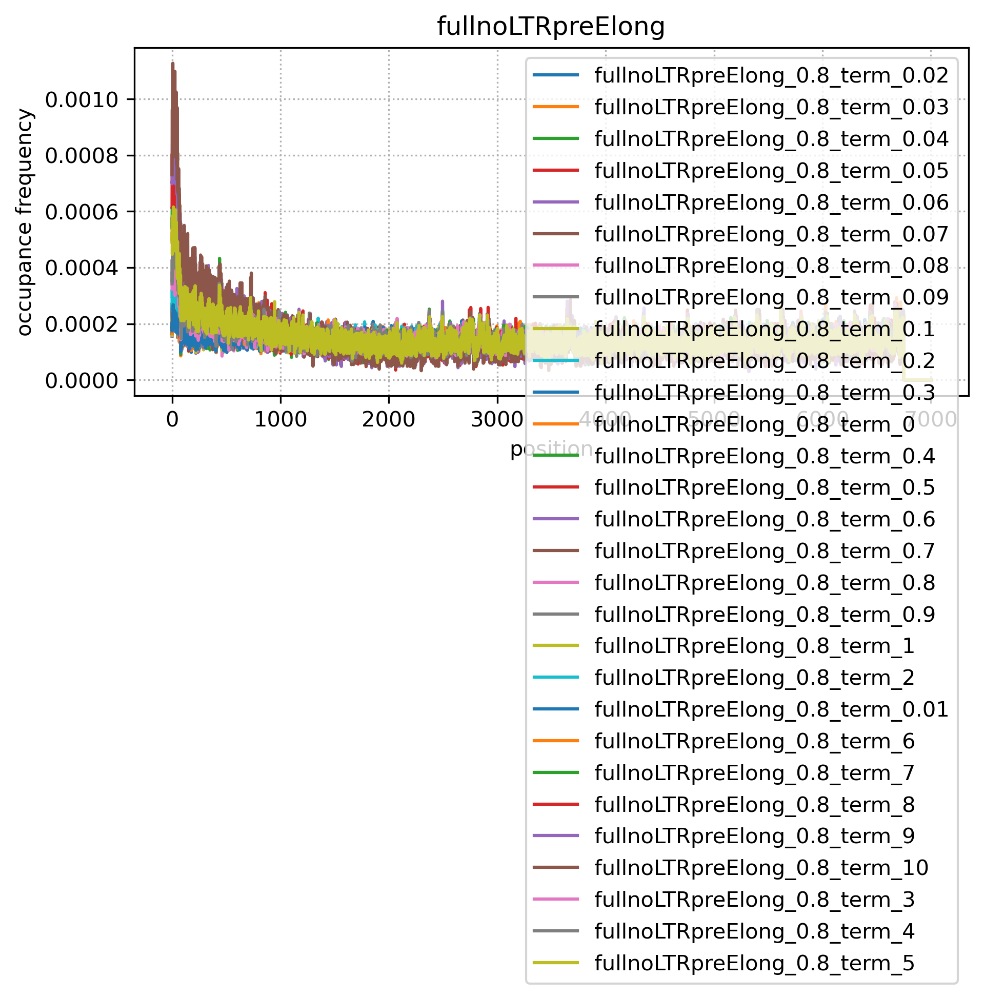

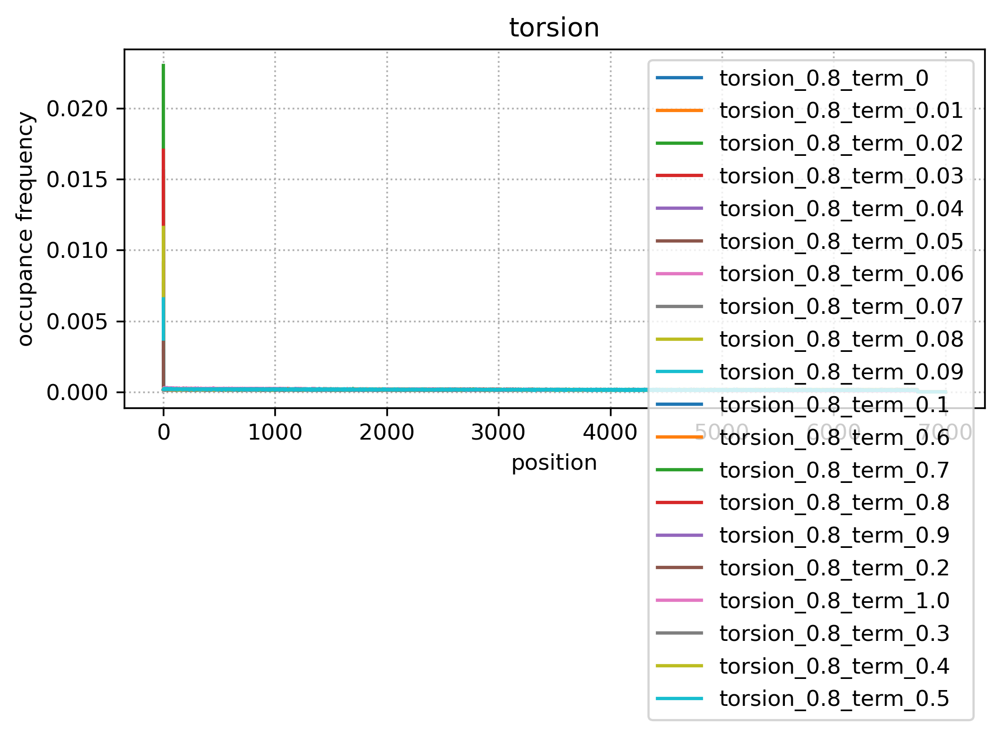

In [10]:
figsize=(7,3)
data = df00_output.T

for group, df_temp in data.groupby('modelType'):
    fig = plt.figure(figsize=figsize, dpi=300)
    ax1 = fig.add_subplot()
    a = df01_plots.index.tolist()
    
    for i in df_temp.index:       
        b = df01_plots[i].tolist()
        ax1.plot(a ,b ,label=i)

    ax1.legend()
    ax1.grid(True,ls="dotted")
    ax1.set_xlabel('position')
    ax1.set_ylabel('occupance frequency')
    plt.title(group)
    plt.show()

In [11]:
import plotly.graph_objects as go

# Create figure
fig = go.Figure()

for group, df_temp in data.groupby('modelType'):
    a = df_temp['nParticles'].tolist()
    b = df_temp['xEnd'].tolist()
    names = df_temp.index.tolist()

    fig.add_trace(
        go.Scatter(x=a, y=b,text=names))

fig.update_traces(
    hoverinfo="name+x+text",
    line={"width": 0.5},
    marker={"size": 8},
    mode="markers",
    showlegend=False
)

fig.update_layout(template="plotly_white")

fig.show()

In [12]:
import plotly.express as px
fig = px.scatter(data, x="nParticles", y="xEnd", color="modelType", symbol="modelType")
fig.update_layout(template="plotly_white")
fig.add_shape( # add a horizontal "target" line
    type="line", line_color="salmon", line_width=3, opacity=1, line_dash="dot",
    x0=0, x1=1, y0=200000, y1=200000, yref="y"
)
# fig.add_shape( # add a horizontal "target" line
#     type="line", line_color="green", line_width=3, opacity=1, line_dash="dot",
#     x0=50, x1=50, y0=0, y1=1
# )
# fig.add_shape(type="line",x0=1, y0=0, x1=1, y1=2,
#     line=dict(color="RoyalBlue",width=3)
# )
# fig.add_shape(type="line",
#     x0=2, y0=2, x1=5, y1=2,
#     line=dict(
#         color="LightSeaGreen",
#         width=4,
#         dash="dashdot"))
fig.show()

In [13]:
fig = px.scatter(data, x="tTaken", y="xEnd", color="modelType", symbol="modelType")
fig.update_layout(template="plotly_white")
fig.add_shape( # add a horizontal "target" line
    type="line", line_color="salmon", line_width=3, opacity=1, line_dash="dot",
    x0=0, x1=1, y0=200000, y1=200000, yref="y"
)
# fig.add_shape( # add a horizontal "target" line
#     type="line", line_color="green", line_width=3, opacity=1, line_dash="dot",
#     x0=50, x1=50, y0=0, y1=1
# )
# fig.add_shape(type="line",x0=1, y0=0, x1=1, y1=2,
#     line=dict(color="RoyalBlue",width=3)
# )
# fig.add_shape(type="line",
#     x0=2, y0=2, x1=5, y1=2,
#     line=dict(
#         color="LightSeaGreen",
#         width=4,
#         dash="dashdot"))
fig.show()

# Figures

## stochastic model and implementation of PT

In [14]:
d = data[(data['modelType']=='discrete') & (data['preTermDist']!=0) & (data['addProb']==0.8)].sort_values('preTermProb',ascending=False)
d

,time,c,dist,v5end,addProb,vInt,preTermProb,preTermDist,nParticles,xEnd,xEndPremature,tTaken,processivity,modelType
discrete_0.8_term_1,6000,0,0,0,0.8,50,1,6750,42.4099,70982.8,140766,147.275,0.335222,discrete
discrete_0.8_term_0.9,6000,0,0,0,0.8,50,0.9,6750,44.1621,78482.8,132131,147.321,0.372638,discrete
discrete_0.8_term_0.8,6000,0,0,0,0.8,50,0.8,6750,46.8937,88856.2,123731,147.398,0.417975,discrete
discrete_0.8_term_0.7,6000,0,0,0,0.8,50,0.7,6750,48.4617,97621.9,112116,147.442,0.465448,discrete
discrete_0.8_term_0.6,6000,0,0,0,0.8,50,0.6,6750,51.0578,109209,101606,147.534,0.518033,discrete
discrete_0.8_term_0.5,6000,0,0,0,0.8,50,0.5,6750,53.4502,121069,88978.1,147.621,0.576389,discrete
discrete_0.8_term_0.4,6000,0,0,0,0.8,50,0.4,6750,55.9776,133777,76209.4,147.697,0.637074,discrete
discrete_0.8_term_0.3,6000,0,0,0,0.8,50,0.3,6750,59.4104,150192,59775,147.831,0.715313,discrete
discrete_0.8_term_0.2,6000,0,0,0,0.8,50,0.2,6750,62.6582,168145,41915.6,147.942,0.80046,discrete
discrete_0.8_term_0.1,6000,0,0,0,0.8,50,0.1,6750,66.6799,187777,21590.6,148.096,0.896877,discrete


In [15]:
# from adjustText import adjust_text

# figsize=(5,3)
# dpi=300

# fig = plt.figure(figsize=figsize, dpi=dpi)
# ax1 = fig.add_subplot()

# x = d['nParticles'].tolist()
# y = d['xEnd'].tolist()

# ax1.scatter(x ,y,color='darkblue')

# #points labels
# texts=[]
# s = [str(i) for i in d['preTermProb'].tolist()]
# for t in zip(x,y,s):
#     texts.append(ax1.text(t[0],t[1],t[2]))

# ax1.axvspan(40,60,color='green',alpha=0.1)
# ax1.axhspan(150000,250000,color='green',alpha=0.1)

# # fit regression line
# z = np.polyfit(x, y, deg=2)
# p2 = np.poly1d(z)

# # Plot regression line
# xseq = np.linspace(0, 90, num=100)
# ax1.plot(xseq, p2(xseq), "--", color="k", lw=2.5, alpha=0.5);
    
# ax1.set_xlim(40,75)
# ax1.set_ylim(50000,250000)

# ax1.grid(True,ls="dotted")
# ax1.set_xlabel('RNAPI per rDNA')
# ax1.set_ylabel('Ribosome production')
# plt.title('Effect of premature termination '+'$\it{PT}$'+' on ribosome production')
# adjust_text(texts, only_move={'points':'y', 'texts':'y'}, arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
# plt.savefig(fname="Fig_M_Aalt1.png",dpi=dpi,format='png',bbox_inches='tight', transparent=False)

           2
7.831e+04 x - 2.146e+05 x + 2.086e+05


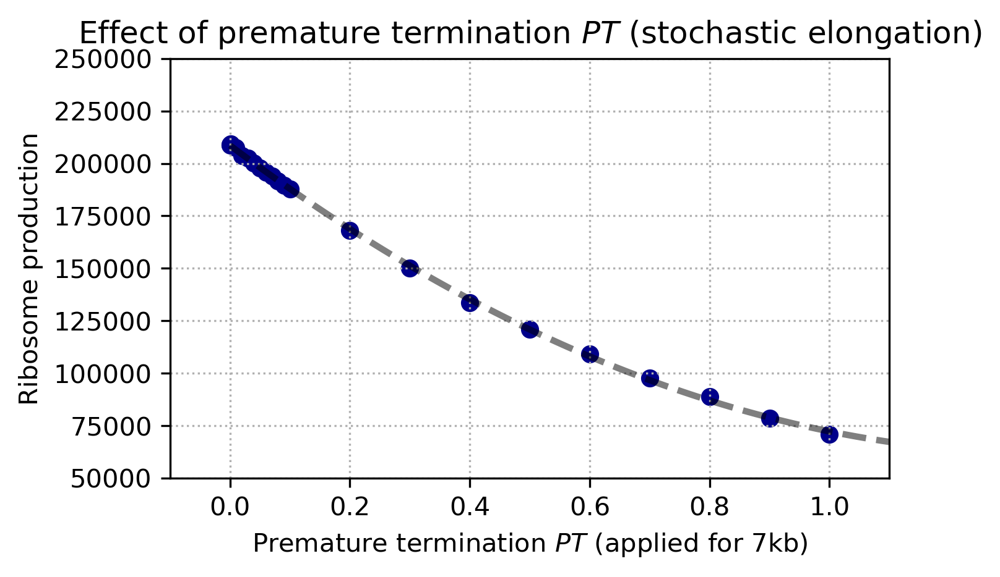

In [16]:
figsize=(5,3)
dpi=300

fig = plt.figure(figsize=figsize, dpi=dpi)
ax1 = fig.add_subplot()

x = d['preTermProb'].tolist()
y = d['xEnd'].tolist()

ax1.scatter(x ,y,color='darkblue')

# fit regression line
z = np.polyfit(x, y, deg=2)
p2 = np.poly1d(z)
print(p2)

# Plot regression line
xseq = np.linspace(0, 1.1, num=100)
ax1.plot(xseq, p2(xseq), "--", color="k", lw=2.5, alpha=0.5)

ax1.set_xlim(-0.1,1.1)
ax1.set_ylim(50000,250000)

# ax1.axhspan(175000,225000,color='green',alpha=0.1)

ax1.grid(True,ls="dotted")
ax1.set_xlabel('Premature termination '+'$\it{PT}$'+' (applied for 7kb)')
ax1.set_ylabel('Ribosome production')
# plt.title('Stochastic elongation and premature termination '+'$\it{PT}$'')
plt.title('Effect of premature termination '+'$\it{PT}$'+' (stochastic elongation)')
plt.savefig(fname="Fig_6A.png",dpi=dpi,format='png',bbox_inches='tight', transparent=False)

In [17]:
# figsize=(5,3)
# dpi=300

# fig = plt.figure(figsize=figsize, dpi=dpi)
# fig.suptitle('Effect of premature termination '+'$\it{PT}$'+' on processivity')

# ax1 = fig.add_subplot(1,2,1)

# x = d['preTermProb'].tolist()
# y = d['processivity'].tolist()

# ax1.scatter(x ,y,color='darkblue')
    
# # ax1.set_ylim(0.8,1.05)
# ax1.set_ylim(0,1.1)
# ax1.set_xlim(-0.01,0.1)

# ax1.grid(True,ls="dotted")
# ax1.set_xlabel('Premature termination '+'$\it{PT}$')
# ax1.set_ylabel('Processivity')

# ax1.spines['right'].set_visible(False)

# ax2 = fig.add_subplot(1,2,2)

# x = d['preTermProb'].tolist()
# y = d['processivity'].tolist()

# ax2.scatter(x ,y,color='darkblue')
    
# ax2.set_ylim(0,1.1)
# ax2.set_xlim(0.1,1.12)

# ax2.grid(True,ls="dotted")
# # ax2.set_xlabel('Premature termination '+'$\it{PT}$')
# ax2.spines['left'].set_visible(False)

# ax1.yaxis.tick_left()
# ax2.yaxis.tick_right()

# # Make the spacing between the two axes a bit smaller
# plt.subplots_adjust(wspace=0.03)


# plt.savefig(fname="Fig_M_A.png",dpi=dpi,format='png',bbox_inches='tight', transparent=False)

In [18]:
d = data[(data['modelType']=='discrete') & (data['preTermProb']==0) & (data['preTermDist']==0)]
d

,time,c,dist,v5end,addProb,vInt,preTermProb,preTermDist,nParticles,xEnd,xEndPremature,tTaken,processivity,modelType
discrete_0.1,6000,0,0,0,0.1,50,0,0,13.3907,40673.4,0,146.476,1,discrete
discrete_0.2,6000,0,0,0,0.2,50,0,0,24.8595,75304.7,0,146.718,1,discrete
discrete_0.3,6000,0,0,0,0.3,50,0,0,34.8194,105323,0,146.962,1,discrete
discrete_0.4,6000,0,0,0,0.4,50,0,0,43.3513,130875,0,147.235,1,discrete
discrete_0.5,6000,0,0,0,0.5,50,0,0,51.2898,154697,0,147.488,1,discrete
discrete_0.6,6000,0,0,0,0.6,50,0,0,57.8215,174056,0,147.705,1,discrete
discrete_0.7,6000,0,0,0,0.7,50,0,0,64.6006,193205,0,147.988,1,discrete
discrete_0.8,6000,0,0,0,0.8,50,0,0,71.2136,208655,0,148.233,1,discrete
discrete_0.9,6000,0,0,0,0.9,50,0,0,77.2823,223073,0,148.524,1,discrete
discrete_1.0,6000,0,0,0,1,50,0,0,81.5669,236517,0,148.772,1,discrete


            2
-1.441e+05 x + 3.742e+05 x + 3550


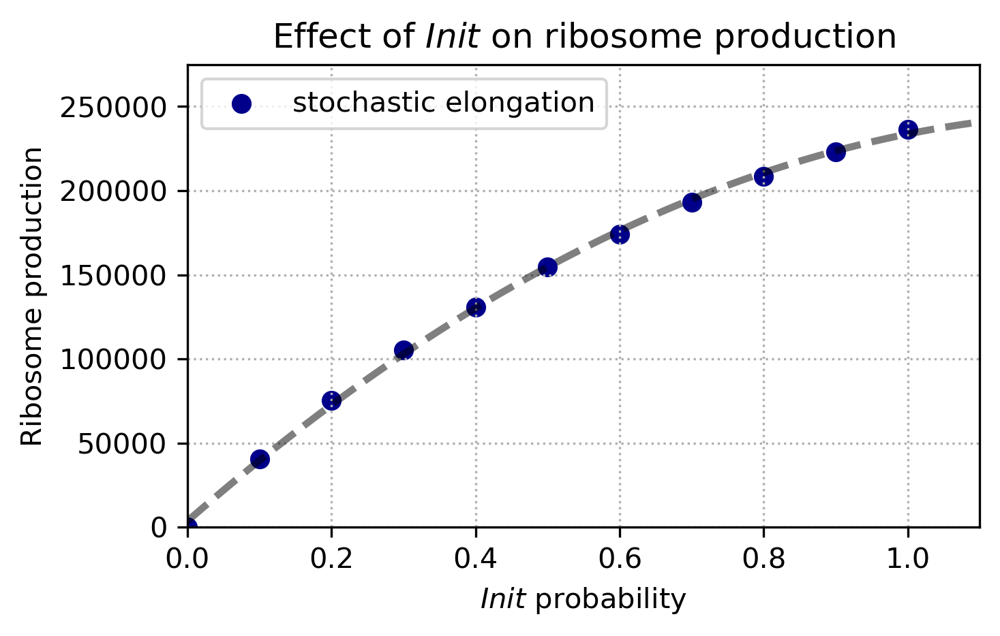

In [19]:
figsize=(5,3)
dpi=300

fig = plt.figure(figsize=figsize, dpi=dpi)
ax1 = fig.add_subplot()

x = [0]+d['addProb'].tolist()
y = [0]+d['xEnd'].tolist()

ax1.scatter(x ,y, color='darkblue',label='stochastic elongation')

# fit regression line
z = np.polyfit(x, y, deg=2)
p2 = np.poly1d(z)
print(p2)

# Plot regression line
xseq = np.linspace(0, 1.1, num=100)
ax1.plot(xseq, p2(xseq), "--", color="k", lw=2.5, alpha=0.5)

# # fit regression line
# z = np.polyfit(x[:5], y[:5], deg=1)
# p2 = np.poly1d(z)
# print(p2)

# # Plot regression line
# xseq = np.linspace(0, 1.1, num=100)
# ax1.plot(xseq, p2(xseq), "-", color="k", lw=2.5, alpha=0.5)

ax1.set_xlim(0,1.1)
ax1.set_ylim(0,275000)

ax1.grid(True,ls="dotted")
ax1.set_xlabel('$\it{Init}$'+' probability')
ax1.set_ylabel('Ribosome production')
# ax1.set_ylabel('Ribosome production [100 min$^{-1}$]')

plt.legend()
plt.title('Effect of '+'$\it{Init}$'+' on ribosome production')
plt.savefig(fname="Fig_model_optional_1.png",dpi=dpi,format='png',bbox_inches='tight', transparent=False)

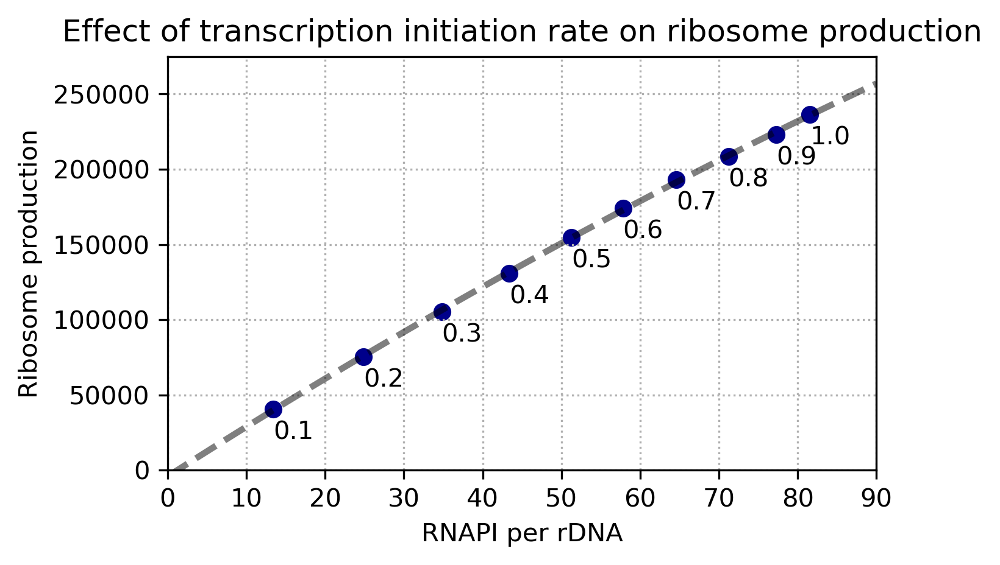

In [20]:
figsize=(5,3)
dpi=300

fig = plt.figure(figsize=figsize, dpi=dpi)
ax1 = fig.add_subplot()

x = d['nParticles'].tolist()
y = d['xEnd'].tolist()

ax1.scatter(x ,y, color='darkblue')

#points labels
s = [str(i) for i in d['addProb'].tolist()]
for t in zip(x,y,s):
    ax1.text(t[0],t[1]-20000,t[2])

# fit regression line
z = np.polyfit(x, y, deg=2)
p2 = np.poly1d(z)

# Plot regression line
xseq = np.linspace(0, 90, num=100)
ax1.plot(xseq, p2(xseq), "--", color="k", lw=2.5, alpha=0.5)
    
ax1.set_xlim(0,90)
ax1.set_ylim(0,275000)

ax1.grid(True,ls="dotted")
ax1.set_xlabel('RNAPI per rDNA')
ax1.set_ylabel('Ribosome production')
plt.title('Effect of transcription initiation rate on ribosome production')
plt.savefig(fname="Fig_model_optional_2.png",dpi=dpi,format='png',bbox_inches='tight', transparent=False)

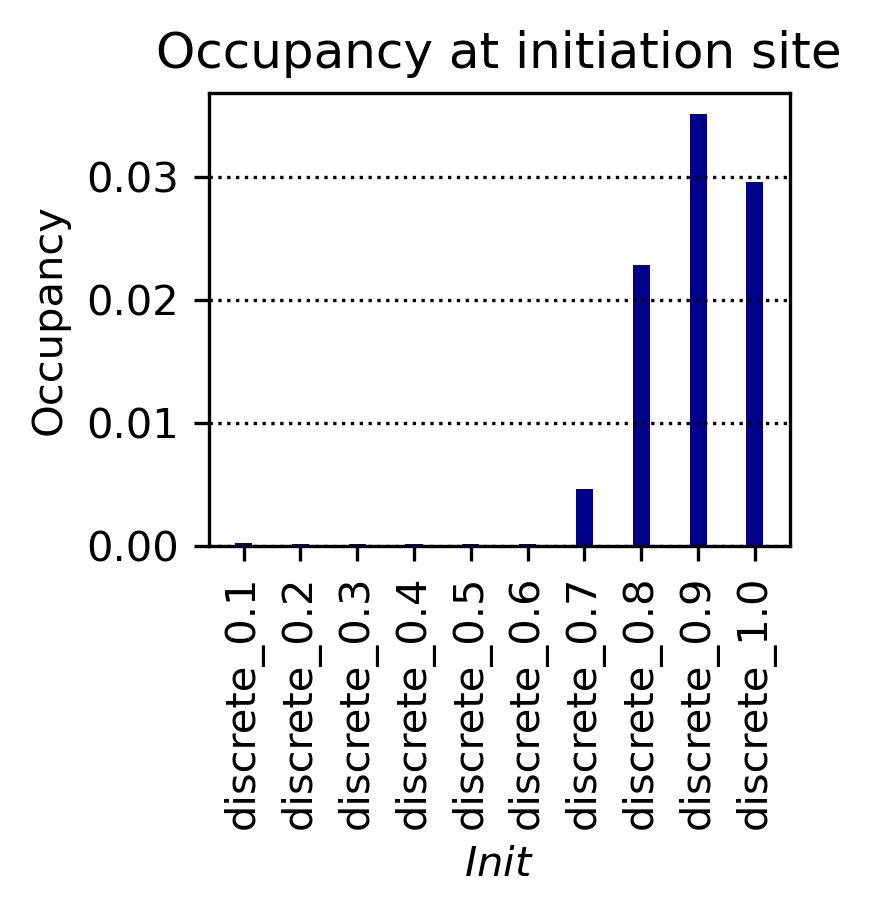

In [21]:
names = d.index.tolist()
peak_value = df01_plots[names].T[0].sort_index()

dpi=300

fig = plt.figure(figsize=(len(peak_value) / 4, 2), dpi=dpi)
ax1 = fig.add_subplot()

x = np.arange(len(peak_value))
width = 0.3

plt.title('Occupancy at initiation site')
ax1.bar(x, peak_value.tolist(), width, color='darkblue')
ax1.set_ylabel('Occupancy')
ax1.set_xlabel('$\it{Init}$')
ax1.grid(axis='y', c='black', ls="dotted")
plt.xticks(x, peak_value.index.tolist(), rotation=90)

plt.savefig(fname="Fig_model_optional_3.png",dpi=dpi,format='png',bbox_inches='tight', transparent=False)

## 5' bias

In [22]:
d = data[(data['addProb']==0.8) & (data['preTermProb']==0) & (data['preTermDist']==6750)]
d

,time,c,dist,v5end,addProb,vInt,preTermProb,preTermDist,nParticles,xEnd,xEndPremature,tTaken,processivity,modelType
discrete_0.8_term_0,6000,0,0,0,0.8,50,0,6750,70.8165,208786,0,148.261,1,discrete
torsion_0.8_term_0,6000,500,0,0,0.8,50,0,6750,70.5656,210178,0,146.931,1,torsion
LER_0.8_term_0,6000,500,2000,0.2,0.8,50,0,6750,64.5078,189117,0,151.623,1,LER
RNA_0.8_term_0,6000,0,0,0,0.8,50,0,6750,51.5254,200339,0,114.657,1,RNA
full_0.8_term_0,6000,500,2000,0.2,0.8,50,0,6750,47.412,176316,0,119.829,1,full


In [23]:
colorType = {
    'discrete' : 'darkblue',
    'torsion'  : 'red',
    'LER'      : '#E75480',
    'RNA'      : 'orange',
    'full'     : 'grey'
}

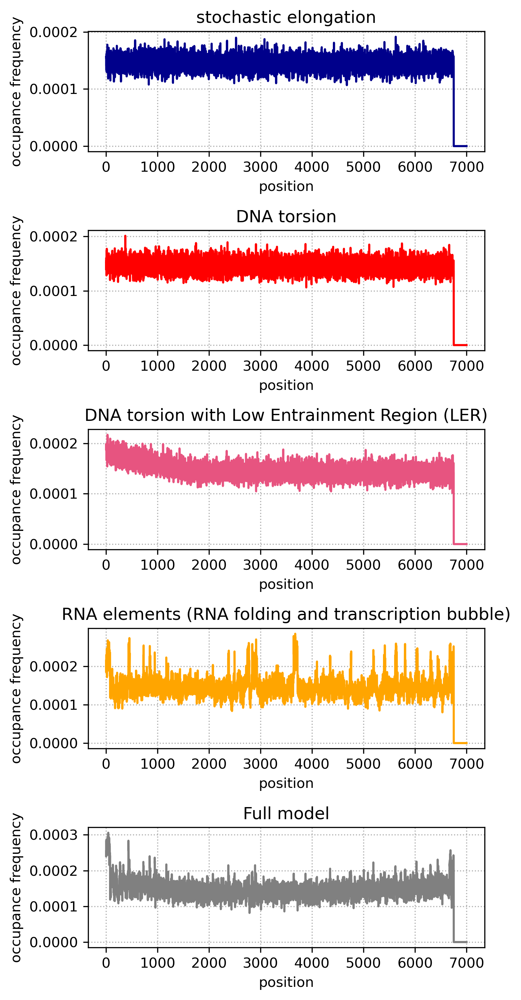

In [24]:
figsize=(5,10)
data = df00_output.T

naming = {'discrete' : 'stochastic elongation',
          'torsion'  : 'DNA torsion',
          'LER'      : 'DNA torsion with Low Entrainment Region (LER)',
          'RNA'      : 'RNA elements (RNA folding and transcription bubble)',
          'full'     : 'Full model'}

fig = plt.figure(figsize=figsize, dpi=300)
for i,name in enumerate(d.index):
    ax1 = fig.add_subplot(5,1,i+1)
    
    a = df01_plots.index.tolist()
    b = df01_plots[name].tolist()
    b = [np.nan]+b[1:] #removing the 5' peak
    ax1.plot(a ,b ,label=name, c=colorType[d['modelType'][name]])

#     ax1.legend()
    ax1.grid(True,ls="dotted")
    ax1.set_xlabel('position')
    ax1.set_ylabel('occupance frequency')
    plt.title(naming[name.split('_')[0]])
plt.tight_layout()
plt.savefig(fname="Fig_S6A.png",dpi=dpi,format='png',bbox_inches='tight', transparent=False)

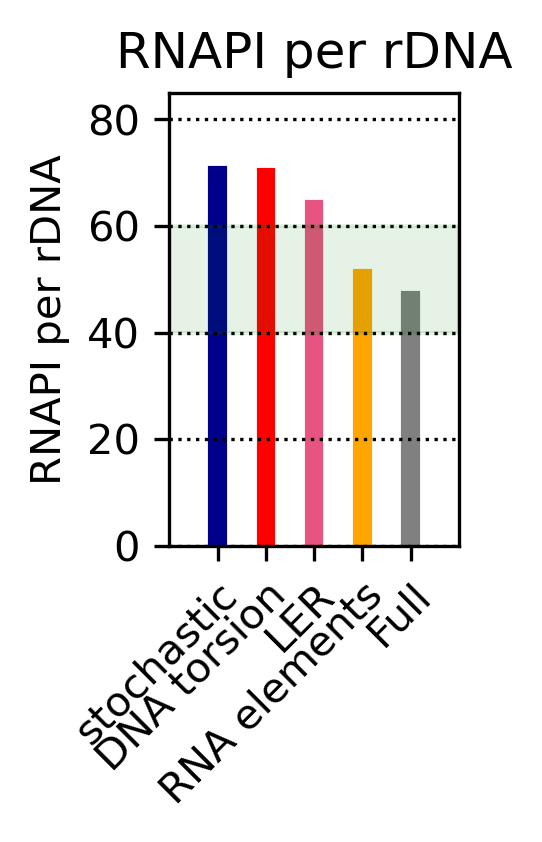

In [25]:
names = d.index.tolist()
peak_value = d['nParticles']

n = ['stochastic','DNA torsion','LER','RNA elements','Full']

dpi=300

fig = plt.figure(figsize=(len(peak_value) / 4, 2), dpi=dpi)
ax1 = fig.add_subplot()

x = np.arange(len(peak_value))
width = 0.3

plt.title('RNAPI per rDNA')
barlist = ax1.bar(x, peak_value.tolist(), width)
for i,name in enumerate(names):
    barlist[i].set_color(colorType[d.loc[name]['modelType']])
ax1.set_ylabel('RNAPI per rDNA')
# ax1.set_xlabel('$\it{Init}$')
ax1.axhspan(40,60,color='green',alpha=0.1)
ax1.grid(axis='y', c='black', ls="dotted")
plt.xticks(x, n, rotation=45,ha="right",rotation_mode='anchor')
plt.margins(0.2)
plt.savefig(fname="Fig_S6C.png",dpi=dpi,format='png',bbox_inches='tight', transparent=False)

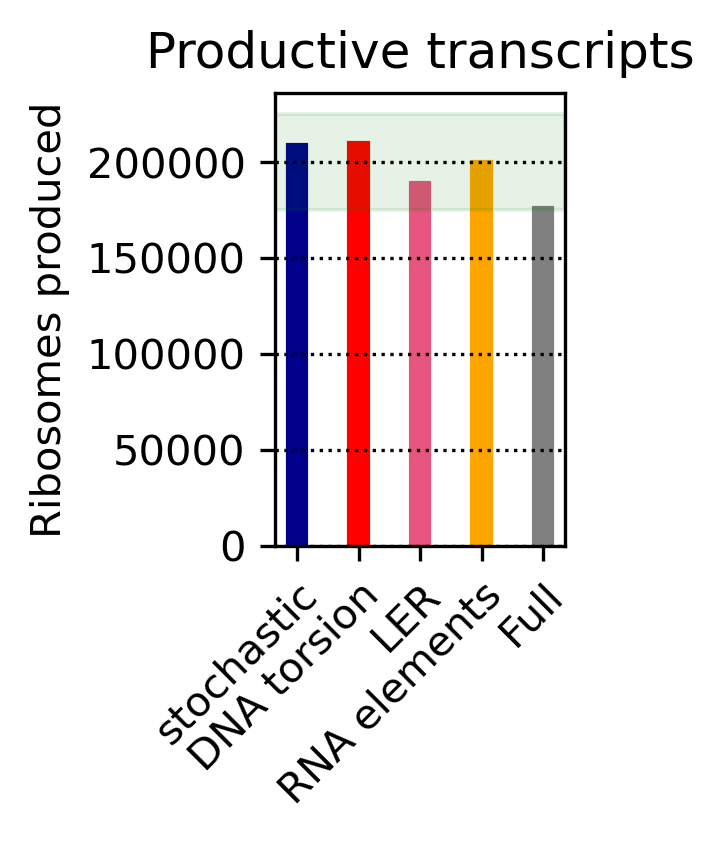

In [26]:
names = d.index.tolist()
peak_value = d['xEnd']

dpi=300

fig = plt.figure(figsize=(len(peak_value) / 4, 2), dpi=dpi)
ax1 = fig.add_subplot()

x = np.arange(len(peak_value))
width = 0.3

plt.title('Productive transcripts')
barlist = ax1.bar(x, peak_value.tolist(), width)
for i,name in enumerate(names):
    barlist[i].set_color(colorType[d.loc[name]['modelType']])
ax1.set_ylabel('Ribosomes produced')
# ax1.set_xlabel('$\it{Init}$')
ax1.axhspan(175000,225000,color='green',alpha=0.1)
ax1.grid(axis='y', c='black', ls="dotted")
plt.xticks(x, n, rotation=45,ha="right",rotation_mode='anchor')

plt.savefig(fname="Fig_S6B.png",dpi=dpi,format='png',bbox_inches='tight', transparent=False)

In [27]:
df00_output.T['modelType'].unique()

array(['discrete', 'discretepreElong', 'torsion', 'LER', 'RNA',
       'RNApreElong', 'full', 'fullnoLTRpreElong'], dtype=object)

In [28]:
d = data[(data['modelType']=='discretepreElong')].sort_values("preTermProb",ascending=False)
# d['preTermProb'] = d['preTermProb'] * (2000/7000)
d

,time,c,dist,v5end,addProb,vInt,preTermProb,preTermDist,nParticles,xEnd,xEndPremature,tTaken,processivity,modelType
discretepreElong_0.8_term_10,6000,0,0,0,0.8,50,10,2000,8.11819,8334.38,208012,146.262,0.0385232,discretepreElong
discretepreElong_0.8_term_9,6000,0,0,0,0.8,50,9,2000,9.53712,11742.2,204909,146.316,0.0541985,discretepreElong
discretepreElong_0.8_term_8,6000,0,0,0,0.8,50,8,2000,11.0749,15768.8,199800,146.407,0.0731495,discretepreElong
discretepreElong_0.8_term_7,6000,0,0,0,0.8,50,7,2000,13.3067,21792.2,193458,146.488,0.101241,discretepreElong
discretepreElong_0.8_term_6,6000,0,0,0,0.8,50,6,2000,16.2674,30520.3,184308,146.486,0.142069,discretepreElong
discretepreElong_0.8_term_5,6000,0,0,0,0.8,50,5,2000,19.9537,41578.1,172388,146.649,0.194322,discretepreElong
discretepreElong_0.8_term_4,6000,0,0,0,0.8,50,4,2000,25.0599,58003.1,155948,146.754,0.271104,discretepreElong
discretepreElong_0.8_term_3,6000,0,0,0,0.8,50,3,2000,31.6458,79148.4,133856,146.937,0.371581,discretepreElong
discretepreElong_0.8_term_2,6000,0,0,0,0.8,50,2,2000,40.8325,109814,102473,147.201,0.517289,discretepreElong
discretepreElong_0.8_term_1,6000,0,0,0,0.8,50,1,2000,52.9824,151416,59048.4,147.588,0.719437,discretepreElong


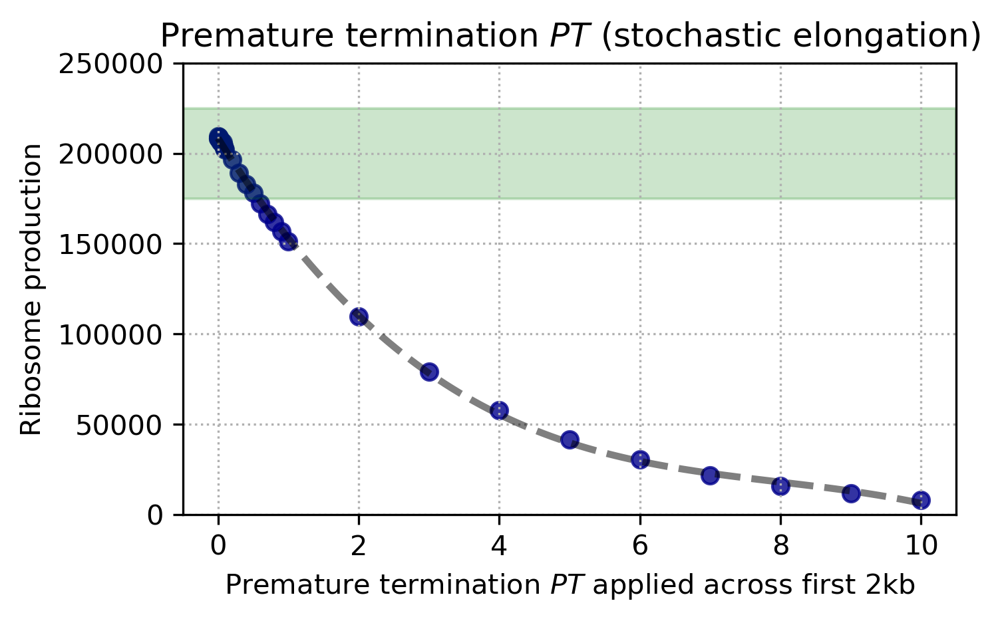

In [29]:
figsize=(5,3)
dpi=300

fig = plt.figure(figsize=figsize, dpi=dpi)
ax1 = fig.add_subplot()

# x = d['preTermProb'].multiply(2.0/7.0).tolist()
x = d['preTermProb'].tolist()
x = d['preTermProb'].tolist()

y = d['xEnd'].tolist()

ax1.scatter(x ,y, color='darkblue',alpha=0.8)

# #points labels
# s = [str(i) for i in d['preTermProb'].tolist()]
# for t in zip(x,y,s):
#     ax1.text(t[0],t[1]-20000,t[2])

# fit regression line
z = np.polyfit(x, y, deg=3)
p2 = np.poly1d(z)

# Plot regression line
xseq = np.linspace(0, 10, num=100)
ax1.plot(xseq, p2(xseq), "--", color="k", lw=2.5, alpha=0.5)
    
# ax1.set_xlim(0,1)
ax1.set_ylim(0,250000)

# ax1.axvspan(40,60,color='green',alpha=0.1)
ax1.axhspan(175000,225000,color='green',alpha=0.2)
# ax1.axhspan(150000,175000,color='orange',alpha=0.2)
# ax1.axhspan(100000,150000,color='red',alpha=0.2)
# ax1.axhspan(0,100000,color='grey',alpha=0.2)

ax1.grid(True,ls="dotted")
ax1.set_xlabel('Premature termination '+'$\it{PT}$'+' applied across first 2kb')
ax1.set_ylabel('Ribosome production')
plt.title('Premature termination '+'$\it{PT}$'+' (stochastic elongation)')
plt.savefig(fname="Fig_S6D.png",dpi=dpi,format='png',bbox_inches='tight', transparent=False)

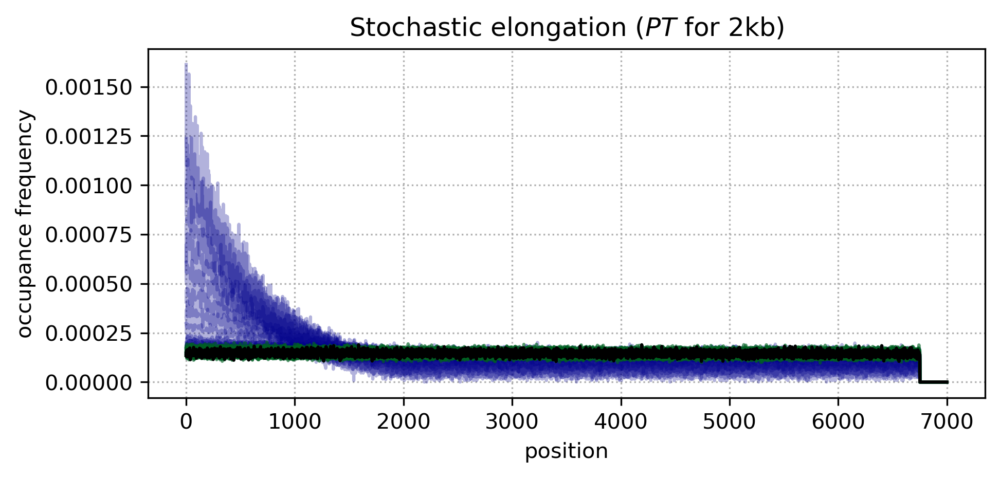

In [30]:
figsize=(7,3)

fig = plt.figure(figsize=figsize, dpi=300)
ax1 = fig.add_subplot()
a = df01_plots.index.tolist()

for i in d.index:
    b = df01_plots[i].tolist()
    b = [np.nan]+b[1:]
    ax1.plot(a ,b ,label=i, c='darkblue',alpha=0.3)
    if d.loc[i]['preTermProb'] < 0.5:
        ax1.plot(a ,b ,label=i, c='green',alpha=0.5)
    if d.loc[i]['preTermProb'] == 0.0:
        ax1.plot(a ,b ,label=i, c='black')

# ax1.legend()
ax1.grid(True,ls="dotted")
ax1.set_xlabel('position')
ax1.set_ylabel('occupance frequency')
plt.title('Stochastic elongation ('+'$\it{PT}$'+' for 2kb)')
plt.savefig(fname="Fig_S6E.png",dpi=dpi,format='png',bbox_inches='tight', transparent=False)

In [31]:
d = data[(data['modelType']=='RNApreElong')].sort_values("preTermProb",ascending=False)
d

,time,c,dist,v5end,addProb,vInt,preTermProb,preTermDist,nParticles,xEnd,xEndPremature,tTaken,processivity,modelType
RNApreElong_0.8_term_10,6000,0,0,0,0.8,50,10,2000,8.59437,16425,188128,113.845,0.080297,RNApreElong
RNApreElong_0.8_term_9,6000,0,0,0,0.8,50,9,2000,9.86106,20840.6,183544,113.886,0.101968,RNApreElong
RNApreElong_0.8_term_8,6000,0,0,0,0.8,50,8,2000,11.4285,26685.9,178795,113.939,0.12987,RNApreElong
RNApreElong_0.8_term_7,6000,0,0,0,0.8,50,7,2000,13.3727,34195.3,170259,113.93,0.167251,RNApreElong
RNApreElong_0.8_term_6,6000,0,0,0,0.8,50,6,2000,15.7927,43898.4,159684,113.992,0.215629,RNApreElong
RNApreElong_0.8_term_5,6000,0,0,0,0.8,50,5,2000,18.9317,56700,147216,114.043,0.278056,RNApreElong
RNApreElong_0.8_term_4,6000,0,0,0,0.8,50,4,2000,22.5156,71882.8,129984,114.088,0.35609,RNApreElong
RNApreElong_0.8_term_3,6000,0,0,0,0.8,50,3,2000,27.6821,94214.1,108197,114.185,0.465459,RNApreElong
RNApreElong_0.8_term_2,6000,0,0,0,0.8,50,2,2000,33.7783,121012,79715.6,114.292,0.602868,RNApreElong
RNApreElong_0.8_term_1,6000,0,0,0,0.8,50,1,2000,41.3681,154758,45121.9,114.455,0.774255,RNApreElong


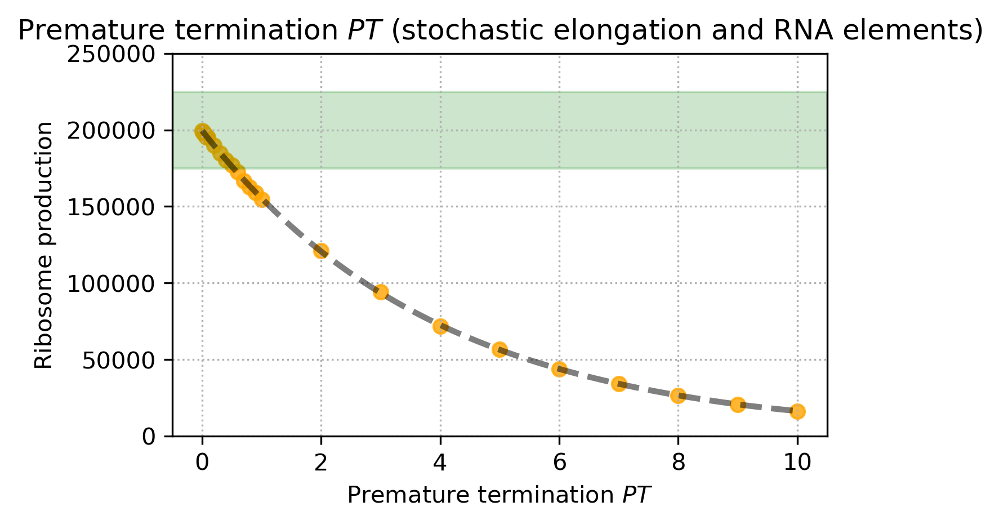

In [32]:
figsize=(5,3)
dpi=300

fig = plt.figure(figsize=figsize, dpi=dpi)
ax1 = fig.add_subplot()

# x = d['preTermProb'].multiply(2.0/7.0).tolist()
x = d['preTermProb'].tolist()
y = d['xEnd'].tolist()

ax1.scatter(x ,y, color='orange',alpha=0.8)

# #points labels
# s = [str(i) for i in d['preTermProb'].tolist()]
# for t in zip(x,y,s):
#     ax1.text(t[0],t[1]-20000,t[2])

# fit regression line
z = np.polyfit(x, y, deg=4)
p2 = np.poly1d(z)

# Plot regression line
xseq = np.linspace(0, 10, num=100)
ax1.plot(xseq, p2(xseq), "--", color="k", lw=2.5, alpha=0.5)
    
# ax1.set_xlim(0,1)
ax1.set_ylim(0,250000)

# ax1.axvspan(40,60,color='green',alpha=0.1)
ax1.axhspan(175000,225000,color='green',alpha=0.2)
# ax1.axhspan(150000,175000,color='orange',alpha=0.2)
# ax1.axhspan(100000,150000,color='red',alpha=0.2)
# ax1.axhspan(0,100000,color='grey',alpha=0.2)

ax1.grid(True,ls="dotted")
ax1.set_xlabel('Premature termination '+'$\it{PT}$')
ax1.set_ylabel('Ribosome production')
plt.title('Premature termination '+'$\it{PT}$'+' (stochastic elongation and RNA elements)')
plt.savefig(fname="Fig_S6F.png",dpi=dpi,format='png',bbox_inches='tight', transparent=False)

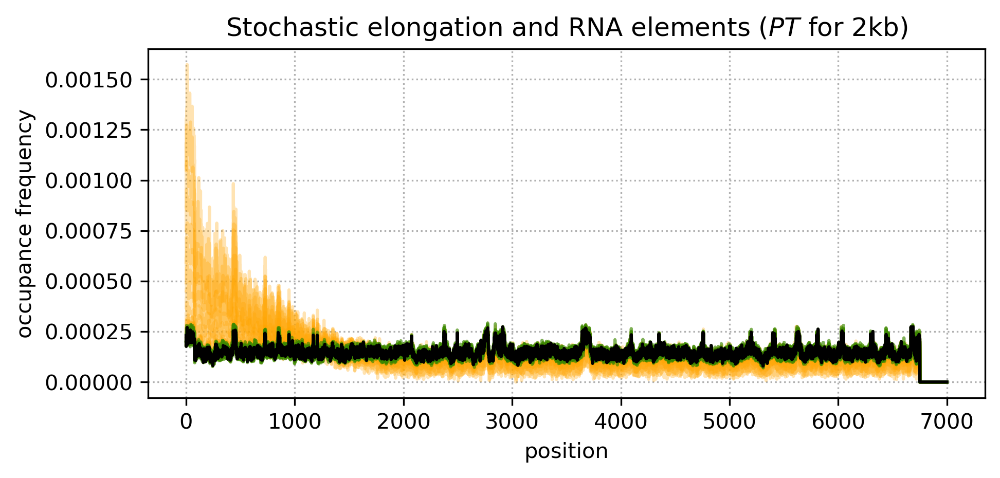

In [33]:
figsize=(7,3)

fig = plt.figure(figsize=figsize, dpi=300)
ax1 = fig.add_subplot()
a = df01_plots.index.tolist()

for i in d.index:       
    b = df01_plots[i].tolist()
    b = [np.nan]+b[1:]
    
    ax1.plot(a ,b ,label=i, c='orange',alpha=0.3)
    if d.loc[i]['preTermProb'] < 0.6:
        ax1.plot(a ,b ,label=i, c='green',alpha=0.5)
    if d.loc[i]['preTermProb'] == 0.0:
        ax1.plot(a ,b ,label=i, c='black')

# ax1.legend()
ax1.grid(True,ls="dotted")
ax1.set_xlabel('position')
ax1.set_ylabel('occupance frequency')
plt.title('Stochastic elongation and RNA elements ('+'$\it{PT}$'+' for 2kb)')
plt.savefig(fname="Fig_S6G.png",dpi=dpi,format='png',bbox_inches='tight', transparent=False)

In [34]:
d = data[(data['modelType']=='fullnoLTRpreElong')].sort_values("preTermProb",ascending=False)
d

,time,c,dist,v5end,addProb,vInt,preTermProb,preTermDist,nParticles,xEnd,xEndPremature,tTaken,processivity,modelType
fullnoLTRpreElong_0.8_term_10,6000,500,0,0,0.8,50,10,2000,11.5324,38020.3,168717,97.9774,0.183906,fullnoLTRpreElong
fullnoLTRpreElong_0.8_term_9,6000,500,0,0,0.8,50,9,2000,12.9486,43453.1,162984,99.7974,0.21049,fullnoLTRpreElong
fullnoLTRpreElong_0.8_term_8,6000,500,0,0,0.8,50,8,2000,14.5101,49340.6,156338,101.249,0.239892,fullnoLTRpreElong
fullnoLTRpreElong_0.8_term_7,6000,500,0,0,0.8,50,7,2000,16.3453,56615.6,149316,102.809,0.274925,fullnoLTRpreElong
fullnoLTRpreElong_0.8_term_6,6000,500,0,0,0.8,50,6,2000,18.4075,64420.3,140728,104.427,0.314018,fullnoLTRpreElong
fullnoLTRpreElong_0.8_term_5,6000,500,0,0,0.8,50,5,2000,21.0824,74901.6,129145,106.009,0.36708,fullnoLTRpreElong
fullnoLTRpreElong_0.8_term_4,6000,500,0,0,0.8,50,4,2000,24.5571,88921.9,115556,107.374,0.434872,fullnoLTRpreElong
fullnoLTRpreElong_0.8_term_3,6000,500,0,0,0.8,50,3,2000,28.8478,106350,96801.6,109.076,0.523501,fullnoLTRpreElong
fullnoLTRpreElong_0.8_term_2,6000,500,0,0,0.8,50,2,2000,34.1942,128372,74278.1,110.741,0.633466,fullnoLTRpreElong
fullnoLTRpreElong_0.8_term_1,6000,500,0,0,0.8,50,1,2000,41.5474,158550,42965.6,112.717,0.786788,fullnoLTRpreElong


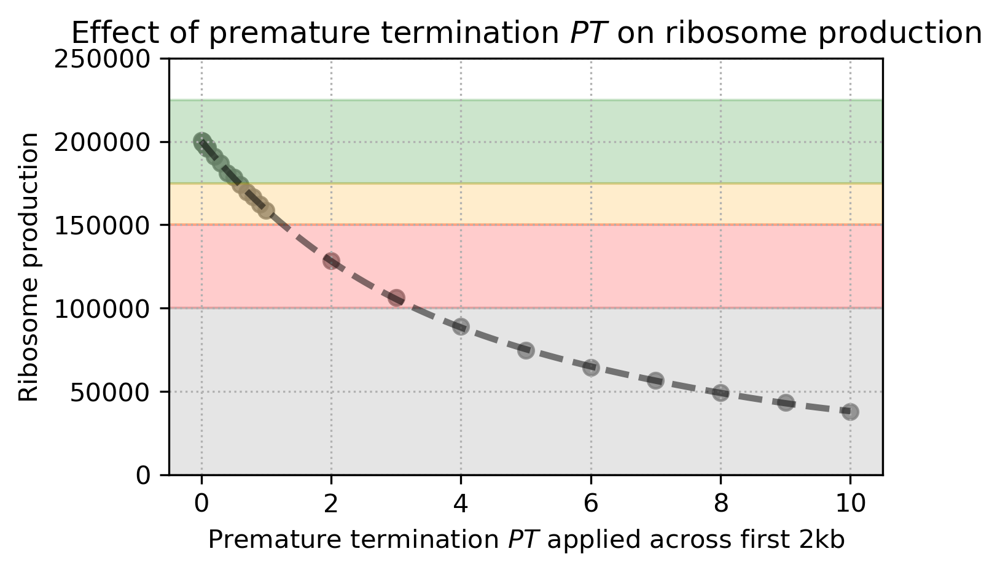

In [35]:
figsize=(5,3)
dpi=300

fig = plt.figure(figsize=figsize, dpi=dpi)
ax1 = fig.add_subplot()

# x = d['preTermProb'].multiply(2.0/7.0).tolist()
x = d['preTermProb'].tolist()
y = d['xEnd'].tolist()

ax1.scatter(x ,y, color='grey',alpha=0.8)

# #points labels
# s = [str(i) for i in d['preTermProb'].tolist()]
# for t in zip(x,y,s):
#     ax1.text(t[0],t[1]-20000,t[2])

# fit regression line
z = np.polyfit(x, y, deg=4)
p2 = np.poly1d(z)

# Plot regression line
xseq = np.linspace(0, 10, num=100)
ax1.plot(xseq, p2(xseq), "--", color="k", lw=2.5, alpha=0.5)
    
# ax1.set_xlim(0,1)
ax1.set_ylim(0,250000)

# ax1.axvspan(40,60,color='green',alpha=0.1)
ax1.axhspan(175000,225000,color='green',alpha=0.2)
ax1.axhspan(150000,175000,color='orange',alpha=0.2)
ax1.axhspan(100000,150000,color='red',alpha=0.2)
ax1.axhspan(0,100000,color='grey',alpha=0.2)

ax1.grid(True,ls="dotted")
ax1.set_xlabel('Premature termination '+'$\it{PT}$'+' applied across first 2kb')
ax1.set_ylabel('Ribosome production')
plt.title('Effect of premature termination '+'$\it{PT}$'+' on ribosome production')
plt.savefig(fname="Fig_6C.png",dpi=dpi,format='png',bbox_inches='tight', transparent=False)

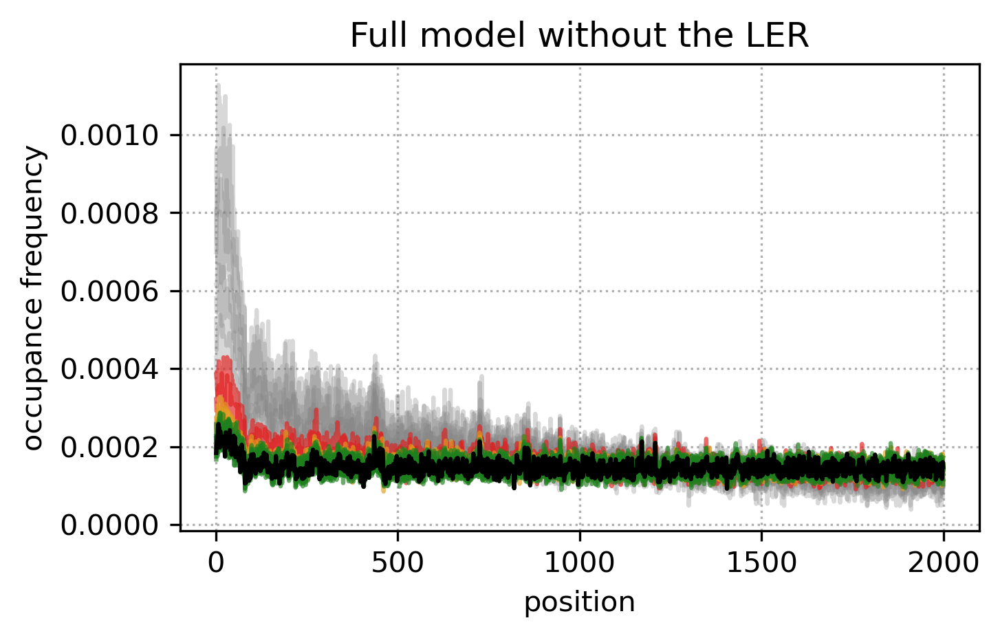

In [36]:
figsize=(5,3)

fig = plt.figure(figsize=figsize, dpi=300)
ax1 = fig.add_subplot()
a = df01_plots[:2000].index.tolist()

for i in d.index:       
    b = df01_plots[i][:2000].tolist()
    b = [np.nan]+b[1:]
    
    ax1.plot(a ,b ,label=i, c='grey',alpha=0.3)
    if d.loc[i]['preTermProb'] <= 0.6:
        ax1.plot(a ,b ,label=i, c='green',alpha=0.5)
    if (d.loc[i]['preTermProb'] <= 1) and (d.loc[i]['preTermProb'] > 0.6):
        ax1.plot(a ,b ,label=i, c='orange',alpha=0.5)
    if (d.loc[i]['preTermProb'] <= 3) and (d.loc[i]['preTermProb'] > 1):
        ax1.plot(a ,b ,label=i, c='red',alpha=0.5)
    if d.loc[i]['preTermProb'] == 0.0:
        ax1.plot(a ,b ,label=i, c='black')

# ax1.legend()
ax1.grid(True,ls="dotted")
ax1.set_xlabel('position')
ax1.set_xticks(np.arange(0,2001,500))
ax1.set_ylabel('occupance frequency')
plt.title('Full model without the LER')
plt.savefig(fname="Fig_6B.png",dpi=dpi,format='png',bbox_inches='tight', transparent=False)

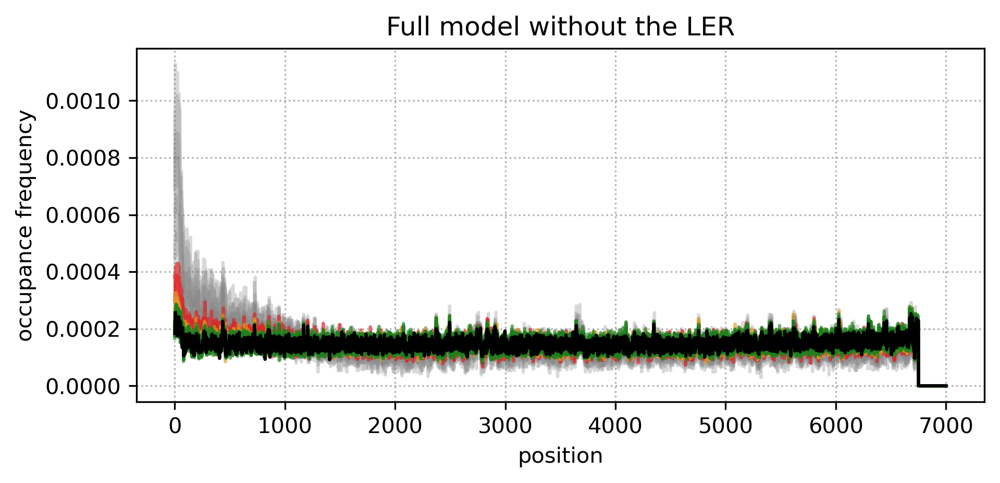

In [37]:
figsize=(7,3)

fig = plt.figure(figsize=figsize, dpi=300)
ax1 = fig.add_subplot()
a = df01_plots.index.tolist()

for i in d.index:       
    b = df01_plots[i].tolist()
    b = [np.nan]+b[1:]
    
    ax1.plot(a ,b ,label=i, c='grey',alpha=0.3)
    if d.loc[i]['preTermProb'] <= 0.6:
        ax1.plot(a ,b ,label=i, c='green',alpha=0.5)
    if (d.loc[i]['preTermProb'] <= 1) and (d.loc[i]['preTermProb'] > 0.6):
        ax1.plot(a ,b ,label=i, c='orange',alpha=0.5)
    if (d.loc[i]['preTermProb'] <= 3) and (d.loc[i]['preTermProb'] > 1):
        ax1.plot(a ,b ,label=i, c='red',alpha=0.5)
    if d.loc[i]['preTermProb'] == 0.0:
        ax1.plot(a ,b ,label=i, c='black')

# ax1.legend()
ax1.grid(True,ls="dotted")
ax1.set_xlabel('position')
ax1.set_ylabel('occupance frequency')
plt.title('Full model without the LER')
plt.savefig(fname="Fig_model_D.png",dpi=dpi,format='png',bbox_inches='tight', transparent=False)

In [38]:
d = data[(data['modelType']=='full')].sort_values("preTermProb",ascending=False)
d

,time,c,dist,v5end,addProb,vInt,preTermProb,preTermDist,nParticles,xEnd,xEndPremature,tTaken,processivity,modelType
full_0.8_term_1.0,6000,500,2000,0.2,0.8,50,1,6750,29.7171,80428.1,98217.2,108.316,0.450211,full
full_0.8_term_0.9,6000,500,2000,0.2,0.8,50,0.9,6750,30.9245,85921.9,92737.5,109.062,0.480926,full
full_0.8_term_0.8,6000,500,2000,0.2,0.8,50,0.8,6750,32.2023,93210.9,84534.4,110.286,0.524407,full
full_0.8_term_0.7,6000,500,2000,0.2,0.8,50,0.7,6750,33.6469,99900,78356.2,111.166,0.560429,full
full_0.8_term_0.6,6000,500,2000,0.2,0.8,50,0.6,6750,35.2019,108112,69965.6,112.176,0.607107,full
full_0.8_term_0.5,6000,500,2000,0.2,0.8,50,0.5,6750,36.8264,116798,60778.1,113.413,0.657736,full
full_0.8_term_0.4,6000,500,2000,0.2,0.8,50,0.4,6750,38.8429,127134,51412.5,114.421,0.71205,full
full_0.8_term_0.3,6000,500,2000,0.2,0.8,50,0.3,6750,40.6504,137723,40321.9,115.685,0.77353,full
full_0.8_term_0.2,6000,500,2000,0.2,0.8,50,0.2,6750,42.6383,149011,28382.8,116.902,0.840001,full
full_0.8_term_0.1,6000,500,2000,0.2,0.8,50,0.1,6750,44.9471,162253,14925,118.259,0.915763,full


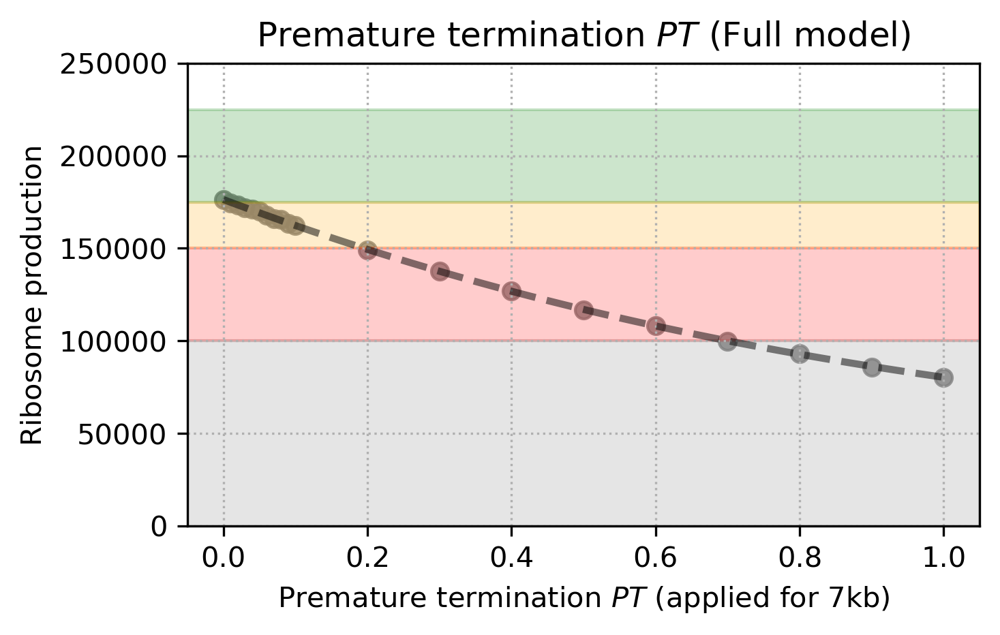

In [39]:
figsize=(5,3)
dpi=300

fig = plt.figure(figsize=figsize, dpi=dpi)
ax1 = fig.add_subplot()

x = d['preTermProb'].tolist()
y = d['xEnd'].tolist()

ax1.scatter(x ,y, color='grey',alpha=0.8)

# #points labels
# s = [str(i) for i in d['preTermProb'].tolist()]
# for t in zip(x,y,s):
#     ax1.text(t[0],t[1]-20000,t[2])

# fit regression line
z = np.polyfit(x, y, deg=4)
p2 = np.poly1d(z)

# Plot regression line
xseq = np.linspace(0, 1, num=100)
ax1.plot(xseq, p2(xseq), "--", color="k", lw=2.5, alpha=0.5)
    
# ax1.set_xlim(0,1)
ax1.set_ylim(0,250000)

# ax1.axvspan(40,60,color='green',alpha=0.1)
ax1.axhspan(175000,225000,color='green',alpha=0.2)
ax1.axhspan(150000,175000,color='orange',alpha=0.2)
ax1.axhspan(100000,150000,color='red',alpha=0.2)
ax1.axhspan(0,100000,color='grey',alpha=0.2)

ax1.grid(True,ls="dotted")
ax1.set_xlabel('Premature termination '+'$\it{PT}$'+' (applied for 7kb)')
ax1.set_ylabel('Ribosome production')
plt.title('Premature termination '+'$\it{PT}$'+' (Full model)')
plt.savefig(fname="Fig_6D.png",dpi=dpi,format='png',bbox_inches='tight', transparent=False)